# EIT Complete Electrode Model - Solver

Antes de utilizar o COLAB, é necessário instalar o FENICS e realizar o upload dos módulos. Procedimento é realizado nas próximas duas células. A vantagem é que não precisa instalar mais nada no computador. A desvantagem é fica mais lerdo por não rodar no bash. Repare, a primeira vez que você rodar vai demorar um pouco por causa que todo o código será compilado em C++ para depois ser reutilizado. Depois, pequenas alterações costumam ser rapidamente calculadas.

In [1]:
%load_ext autoreload

In [3]:
%autoreload
#%%capture
#/\ Ative caso não queira mais ver mensagens.
#https://fem-on-colab.github.io
import eitx
import scipy as sp
import numpy as np
import dolfinx
from matplotlib import pyplot as plt

"Importing modules"
import logging
# Set the logging level to suppress most logs
logging.getLogger('UFL_LEGACY').setLevel(logging.WARNING)
logging.getLogger('dolfin').setLevel(logging.WARNING)
logging.getLogger('PETSc').setLevel(logging.WARNING)
logging.getLogger('FFC').setLevel(logging.WARNING)

from petsc4py import PETSc
print(PETSc.ScalarType)

<class 'numpy.float64'>


Info    : Meshing 1D...
Info    : Meshing curve 1 (Ellipse)
Info    : Done meshing 1D (Wall 0.129084s, CPU 0.120309s)
Info    : Meshing 2D...
Info    : Meshing surface 1 (Plane, Delaunay)
Info    : Done meshing 2D (Wall 0.252409s, CPU 0.256603s)
Info    : 1879 nodes 2957 elements


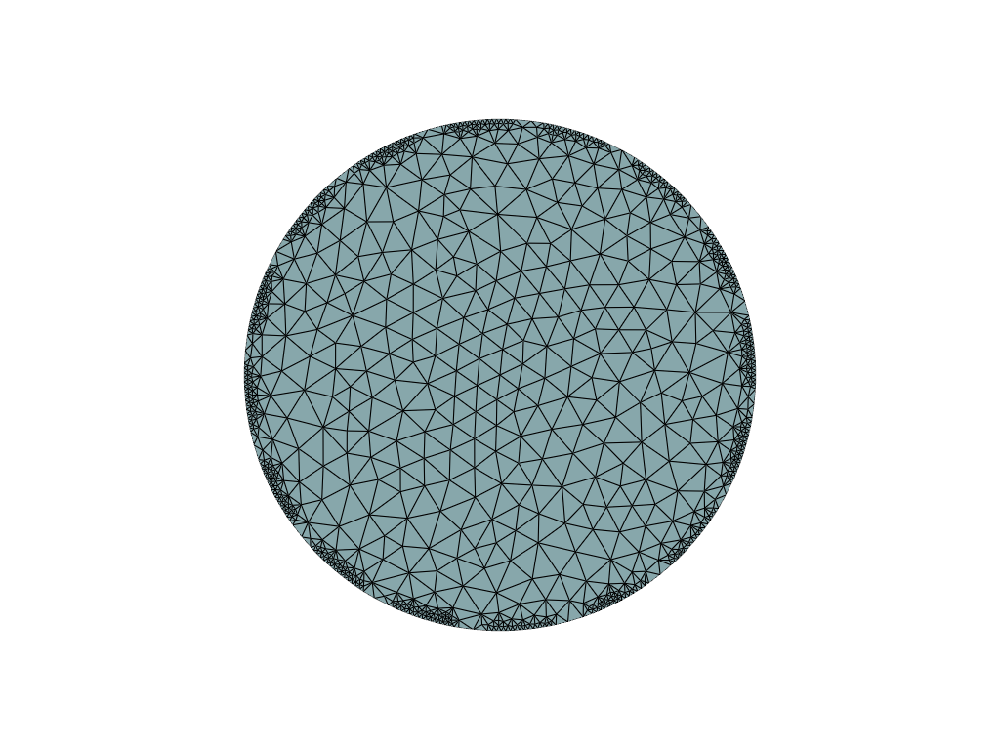

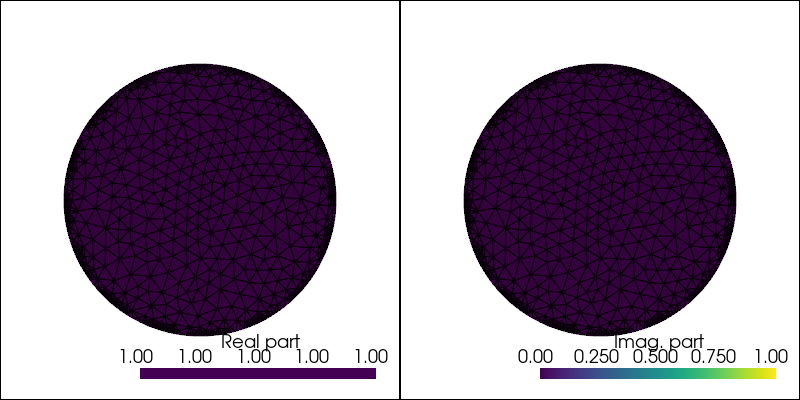

In [207]:
"Forward problem in background"

#Loading data (somente para definir a corrente de maneira correta)
mat = sp.io.loadmat("datamat_1_2")
CP = mat.get("CurrentPattern").T

#Current
I_all=CP[-15:]/np.sqrt(2)
l, L=np.shape(I_all) #Number of experiments = 15, Number of Electrodes = 16
# print(I_all)# MESH (For real data)

"Basic Definitions"
radius=1               #Circle radius
per_cober=0.454728409  #Percentage of area covered by electrodes
rotate=0               #Electrodes Rotation
z=np.ones(L)*0.07858

'Return object with angular position of each electrode'
ele_pos = eitx.Electrodes(L, per_cober, rotate)
refine_n = 8     #Refinement mesh
n_in = 8         #Vertex on elec.
n_out = 2        #Vertex on gaps (Sometimes it is important.)

'Mesh'
# mesh_inverse=MyMesh(radius, refine_n, n_in, n_out, ele_pos)
mesh_object = eitx.MeshClass(ele_pos,0.6,0.6)
mesh = mesh_object.mesh


## Direct problem
dir_problem = eitx.DirectProblem(mesh_object,z)
V0 = dir_problem.V0   # Discontinuous Garlekin space function
V = dir_problem.V     # Continuous Garlekin space function

# 'Plot'
eitx.plot_mesh(mesh)

#"Define gamma as constant = Background"
iv, bg= 10, 1
gamma0 = dolfinx.fem.Function(V0)
gamma0.x.array[:] = bg

# "Plot"
eitx.plot_indicator_function(gamma0)

#Solving Forward Problem
list_u, list_U0_m = dir_problem.solve_problem_current(I_all, gamma0)
list_U0 = np.array(list_U0_m).flatten()

'Plot'
#np.set_printoptions(linewidth=750, precision=3, suppress=False, threshold=1000, formatter=None)
#print(np.matrix(np.round(list_U0_m, 3)))
'Retangular Mesh'

N = 128                               # grid with N*N points (works well with 0 < N < 400)
h = 2*radius/(N-1)                    # step size
x = [radius - i*h for i in range(N)]  # x grid points
y = [-radius + i*h for i in range(N)] # y grid points

# MESH x and y
mesh_x = np.zeros((N,N))              # x-Data (input of CNN)
mesh_y = np.zeros((N,N))              # y-Data (input of CNN)
for i in range(N):
  for j in range(N):
    mesh_x[i][j] = x[i]
    mesh_y[i][j] = y[j]

T1 = []                               # To save data

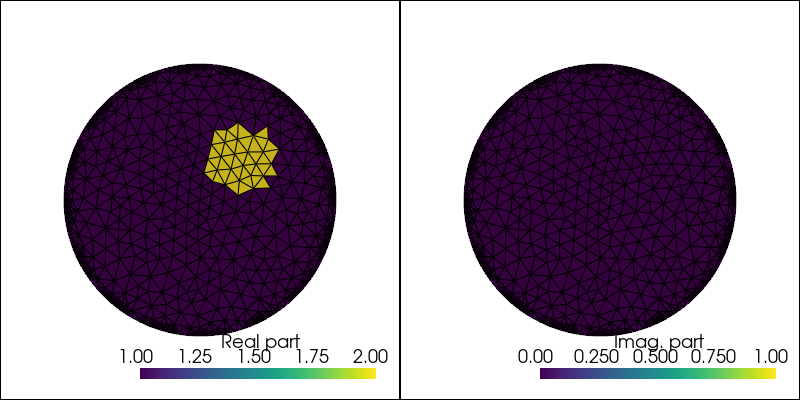

In [227]:
%autoreload
import eitx
gamma = eitx.GammaCircle(V0,2,1,0.25,0.3,0.3)
# gamma = dolfinx.fem.Function(V0)
# gamma.interpolate(lambda x: x[0]+x[1])
eitx.plot_indicator_function(gamma)


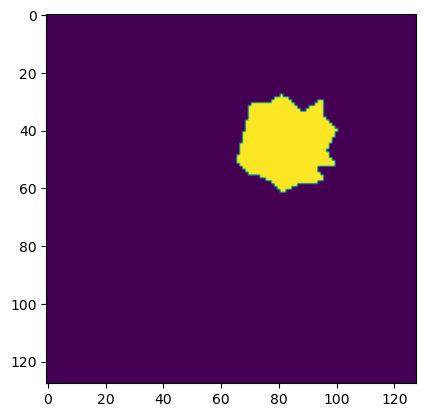

In [230]:
%autoreload
import eitx
gamma_matrix = eitx.genGammaImg(gamma,mesh_x,mesh_y,bg)
plt.imshow(gamma_matrix,interpolation=None)

Generate samples

In [5]:
from matplotlib import pyplot as plt

Generating sample: 1


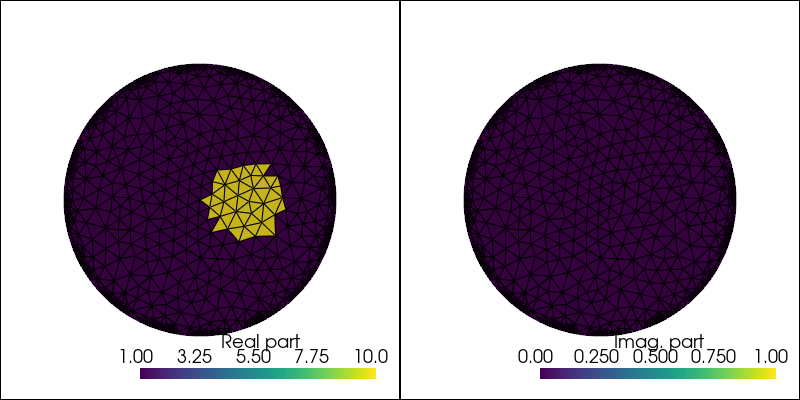

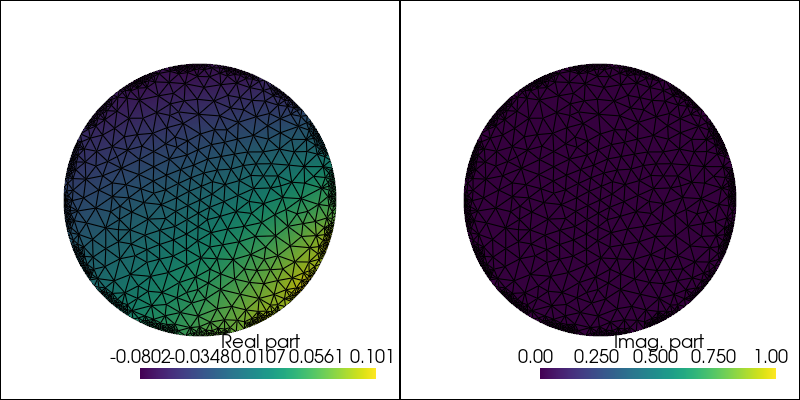

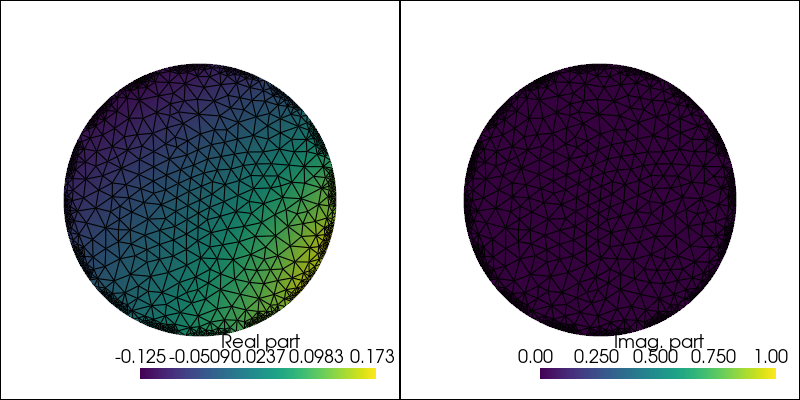

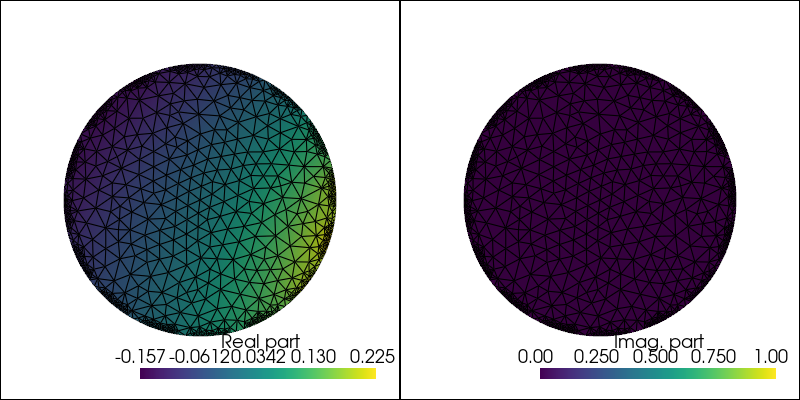

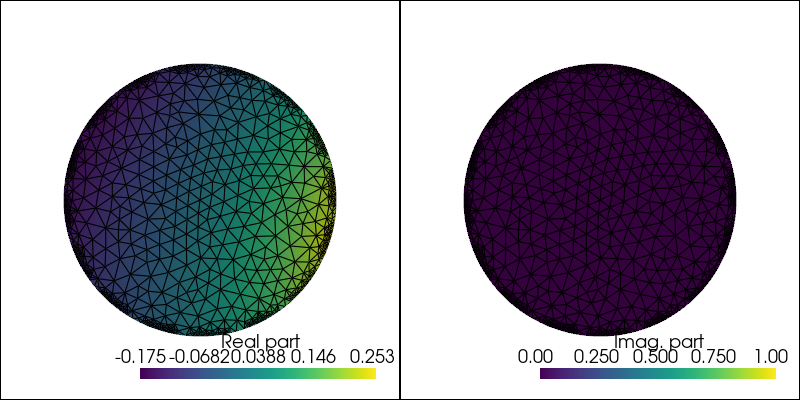

...

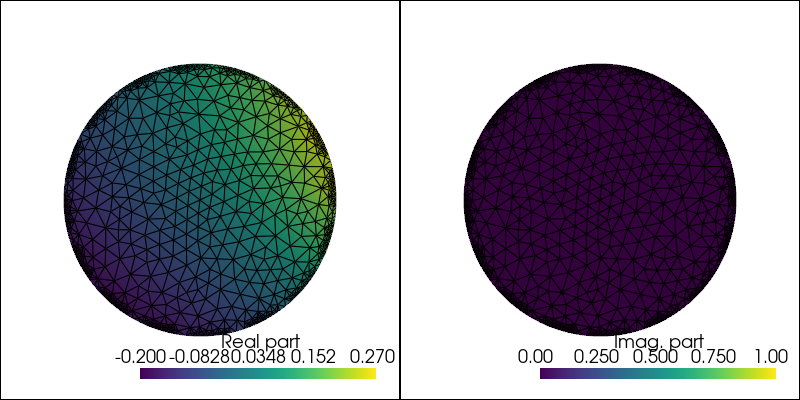

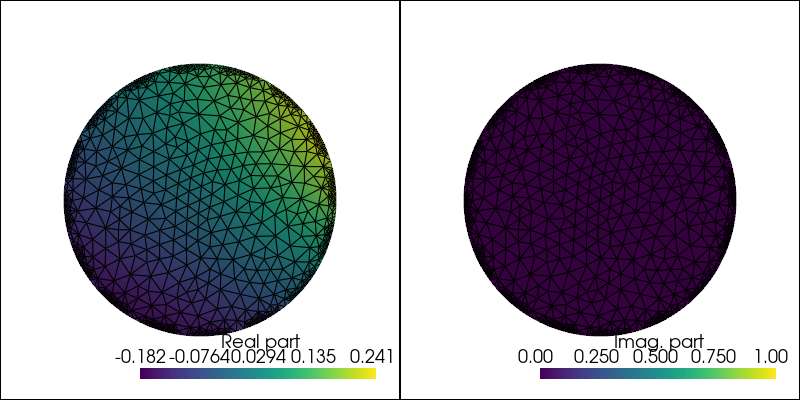

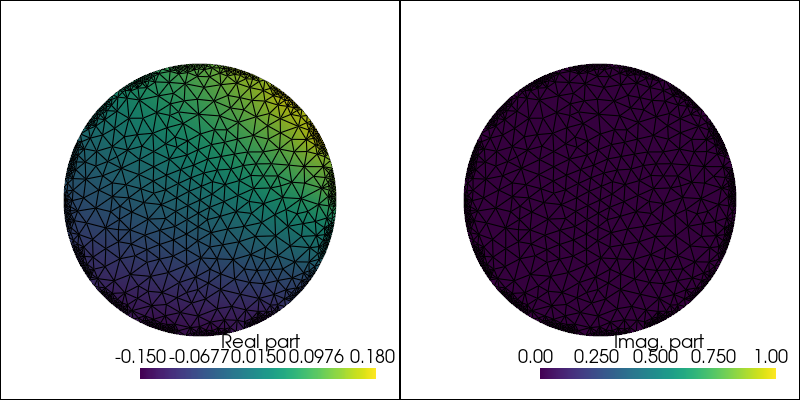

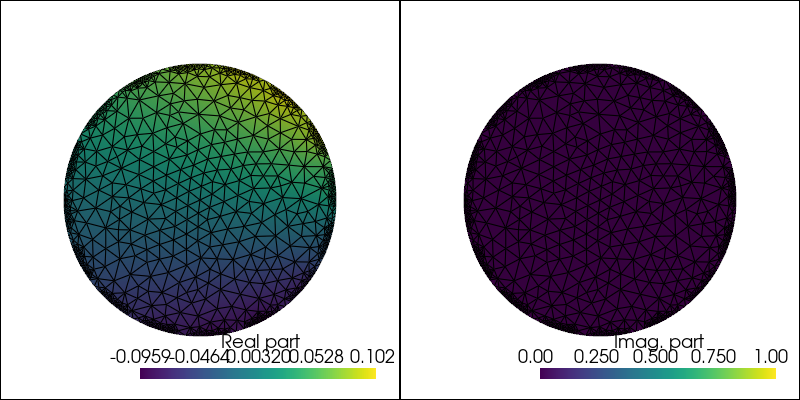

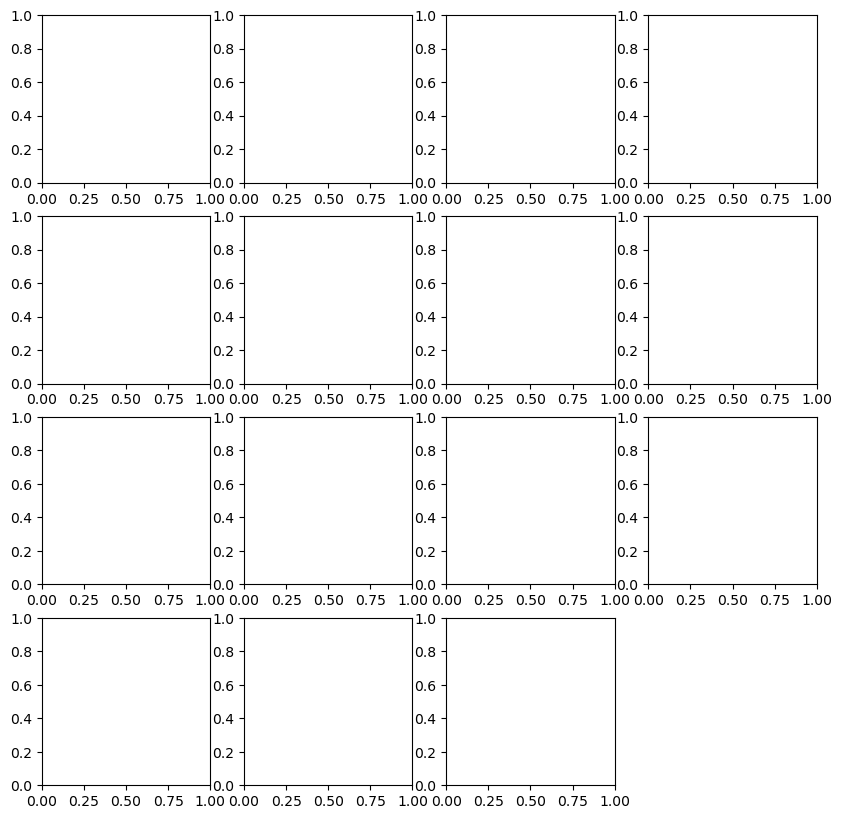

Generation of 1 circle(s) ended.
Generating sample: 2


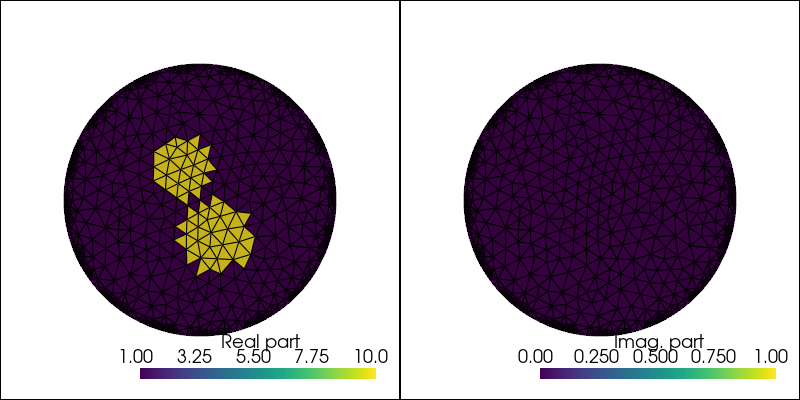

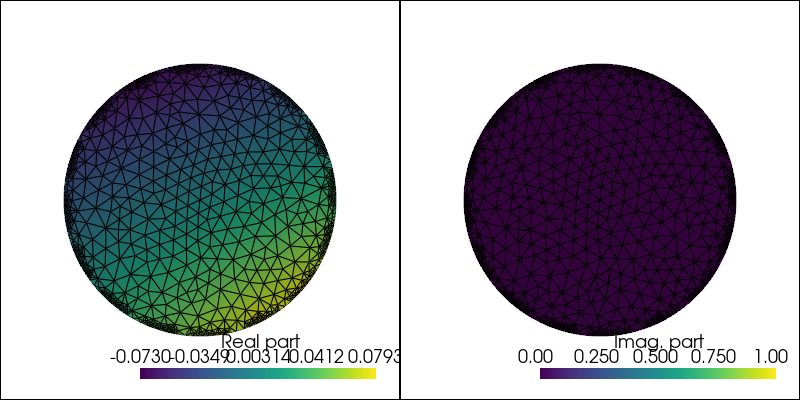

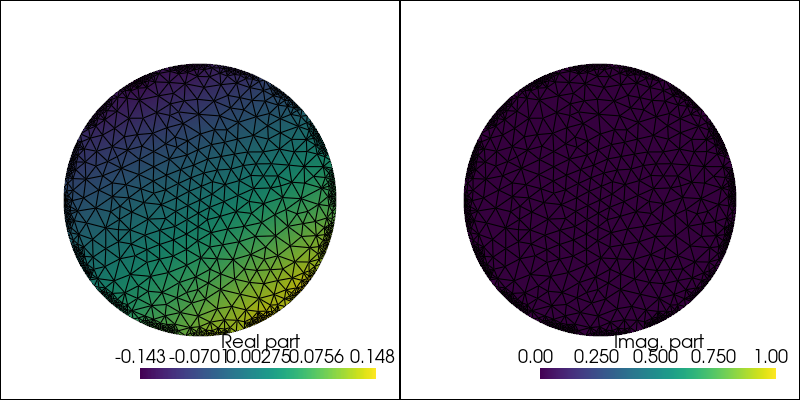

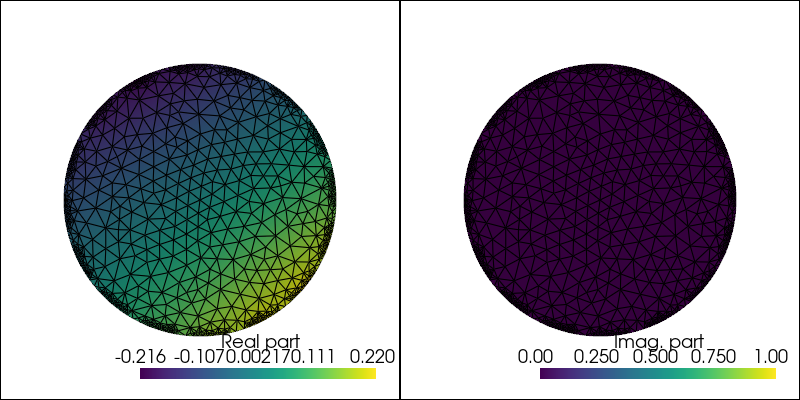

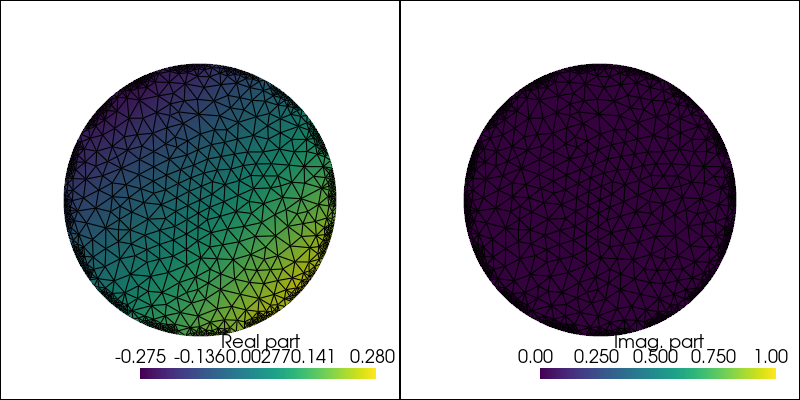

...

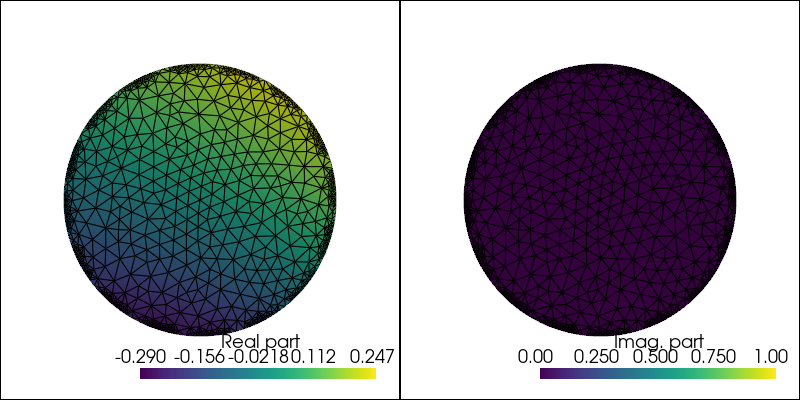

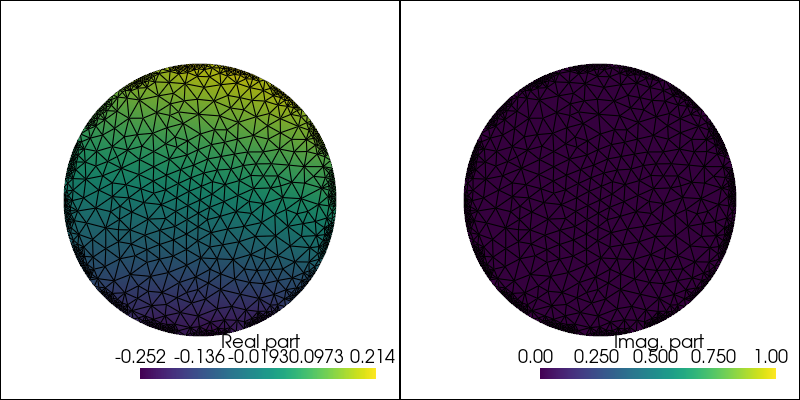

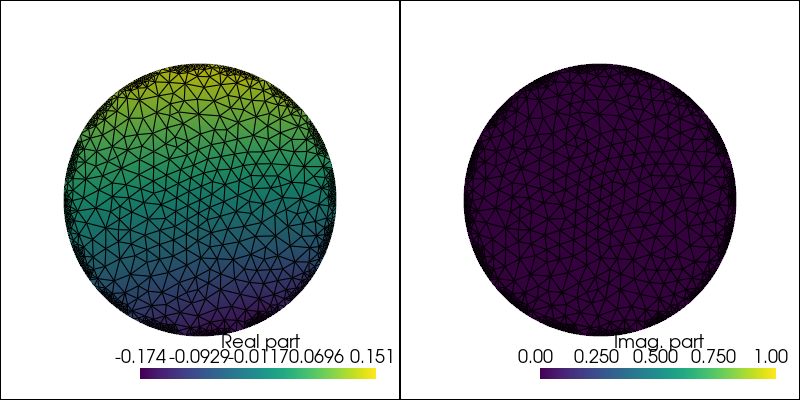

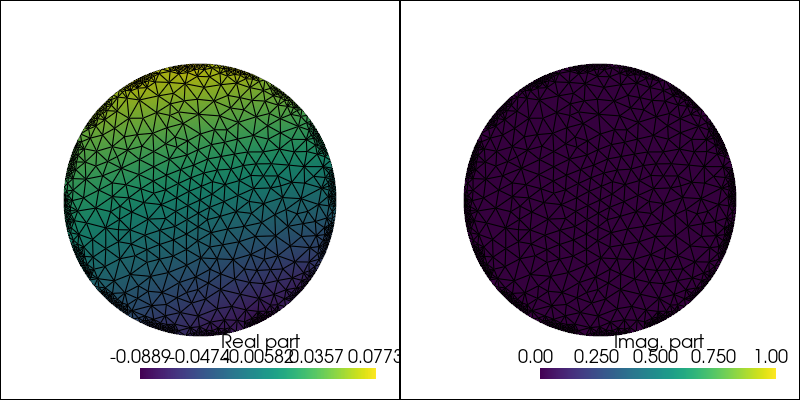

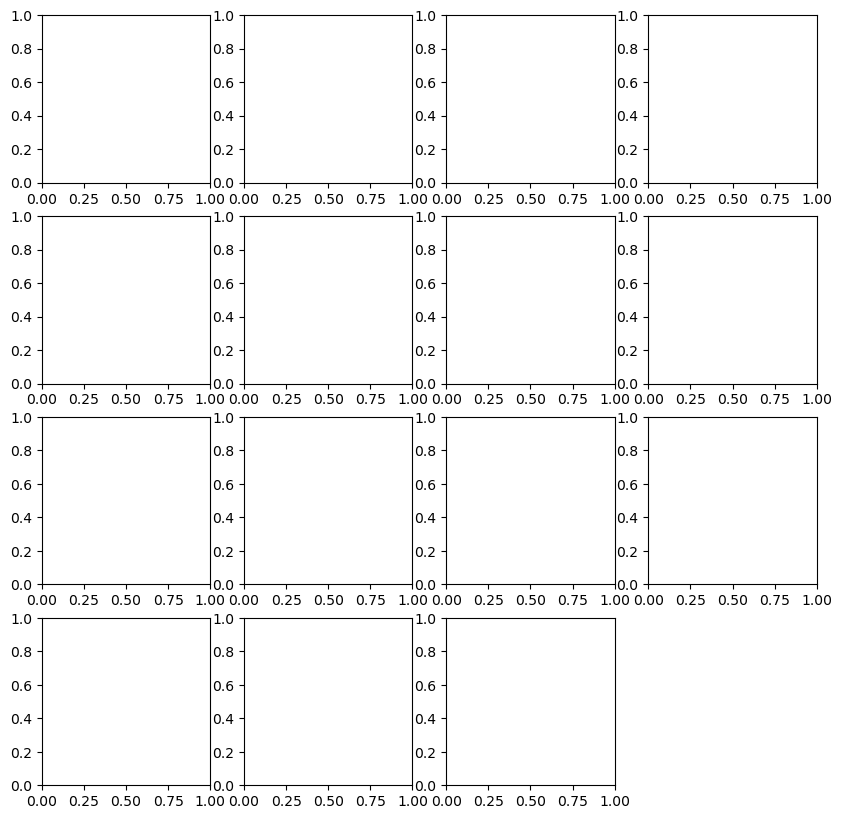

Generating sample: 3


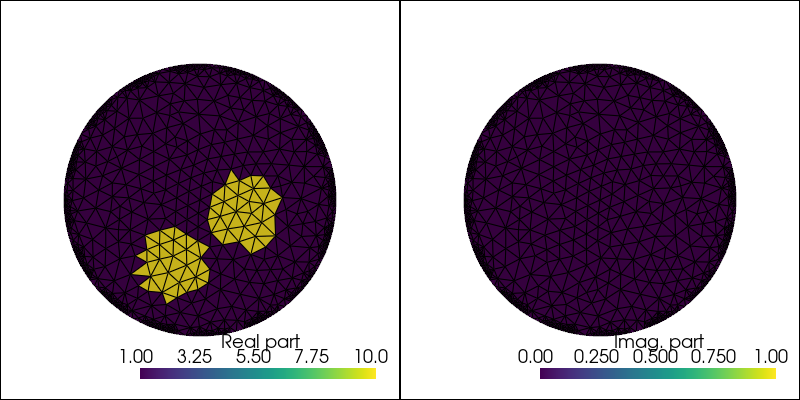

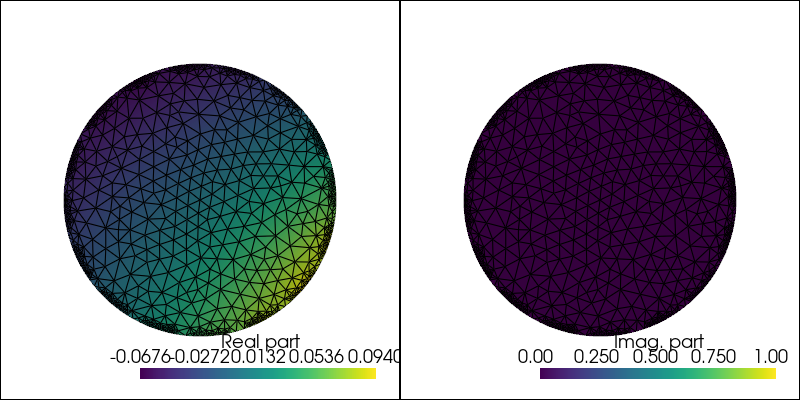

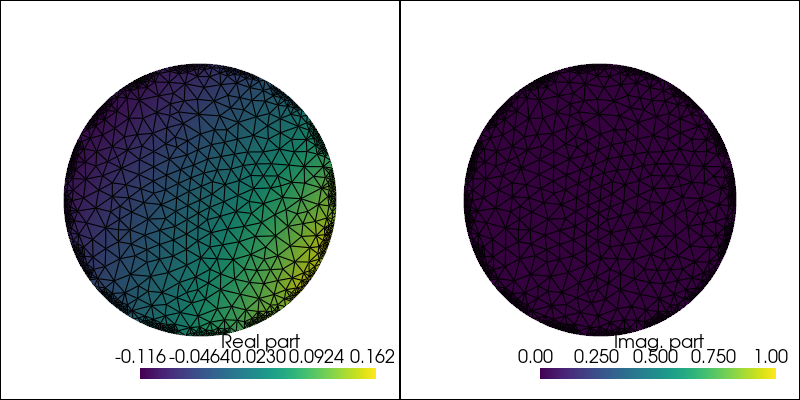

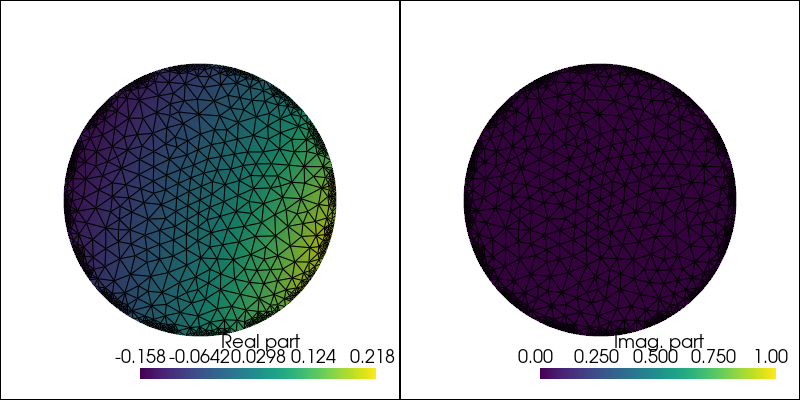

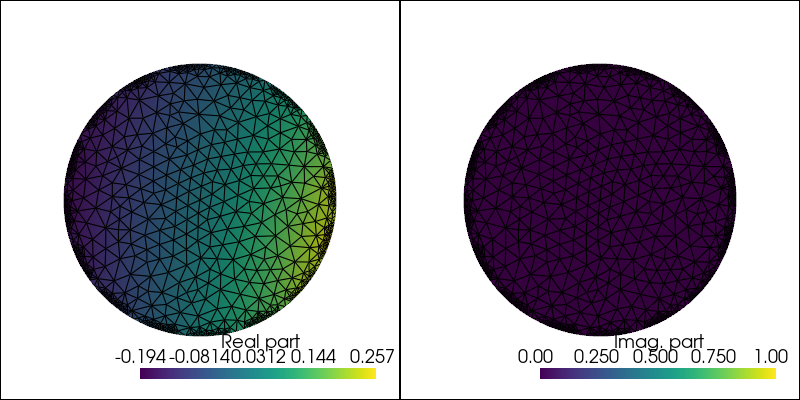

...

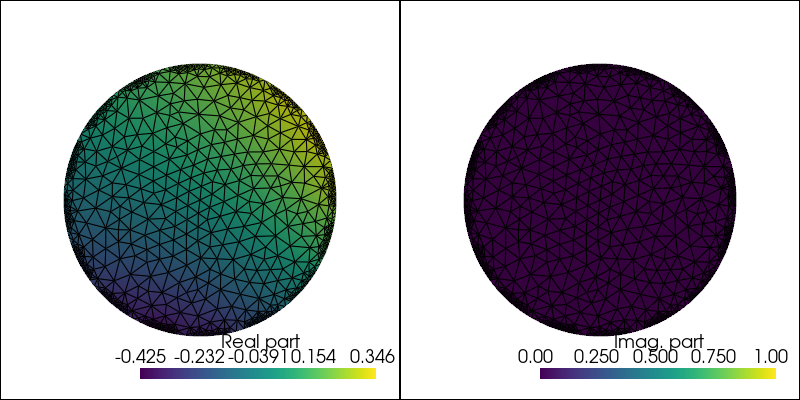

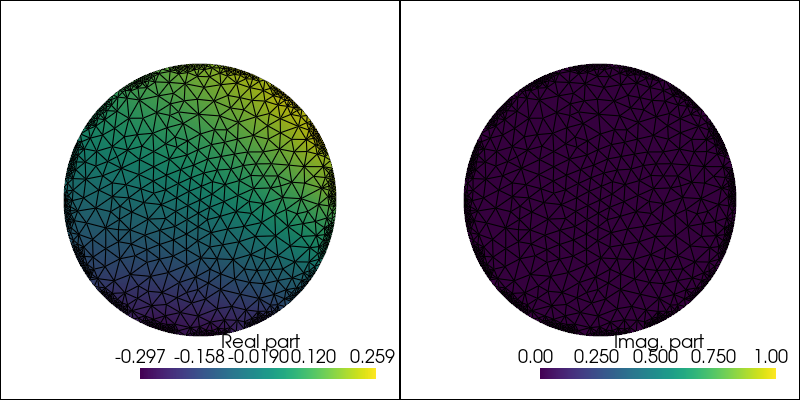

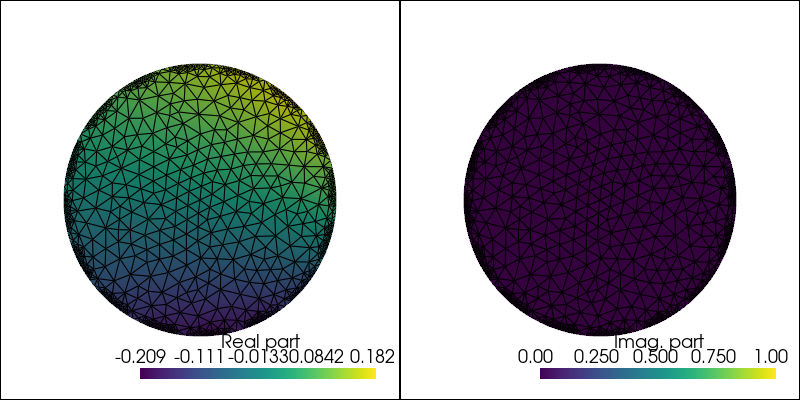

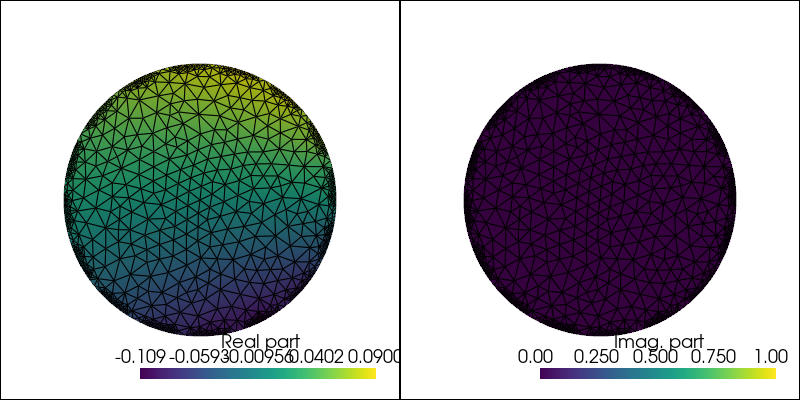

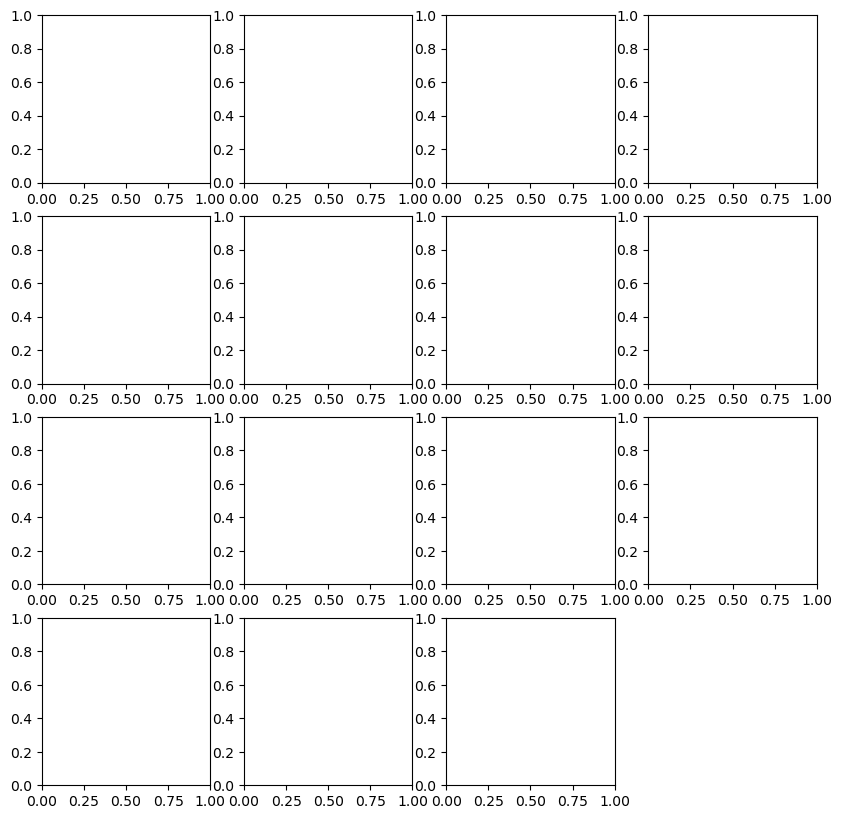

Generation of 2 circle(s) ended.
Generating sample: 4


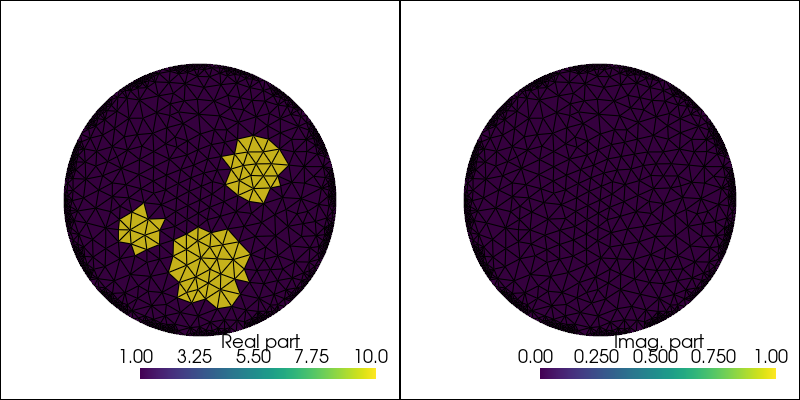

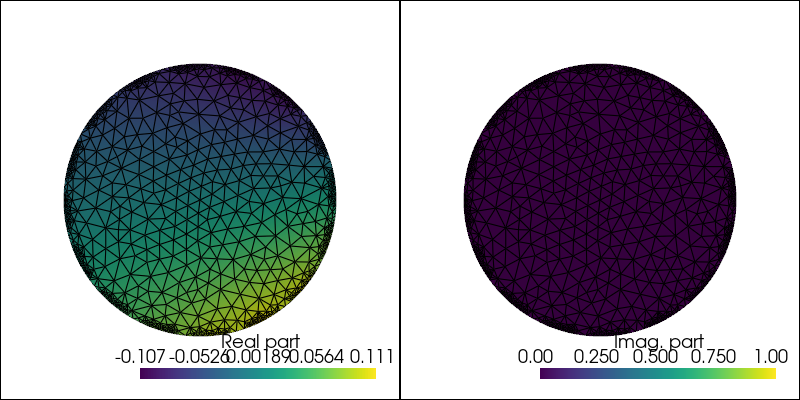

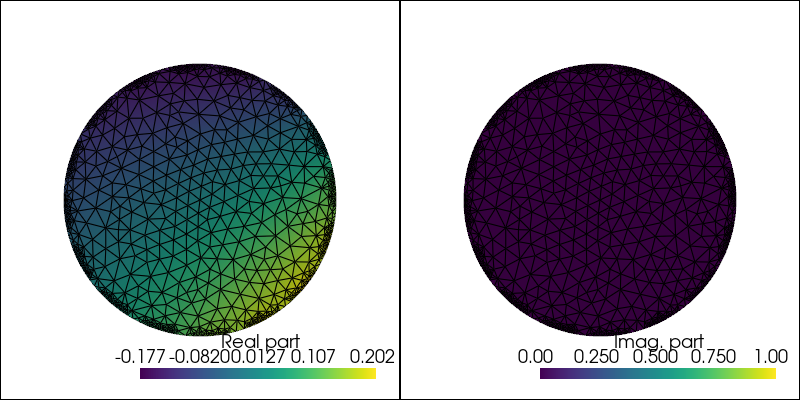

: 

In [19]:
# Loop for generating data

n_samples = [1, 2, 3]               # number of samples in order: 1 circle, 2 circles, 3 circles, etc.
noise_level = 0.0                   # % of artificial noise in data

nn_samples = len(n_samples)
multi = 4                        # number of samples is multiplied by this number
for m in range(nn_samples):
  m_multi_m = (multi**m)*n_samples[m]
  rad_1 = np.random.uniform(0.15*radius, 0.3*radius, (m+1, m_multi_m))                # radius of the inclusions
  center_xy = np.random.uniform(-radius*0.5, radius*0.5, size=(2*(m+1), m_multi_m))   # xy-center of the inclusions
  # print(center_xy), print(rad_1), print(noise)
  vecpop = []                         # vector with indices to withdraw
  for p in range(m):
    for q in range(m - p):
      for j in range(m_multi_m):
        'withdraw indices when iclusions are overlapped'
        x0 = center_xy[2*p,j]
        y0 = center_xy[2*p+1,j]
        x1 = center_xy[2*(p+q)+2,j]
        y1 = center_xy[2*(p+q)+3,j]
        sumrad = rad_1[p,j] + rad_1[(p+q)+1,j]
        dist2 = (x0 - x1)**2 + (y0 - y1)**2
        if dist2 < sumrad**2 + 0.05*radius:               # if the circles touch each other
          vecpop.append(j)
  rad_1 = np.delete(rad_1,vecpop,1)     # remove the indices when the circles touch each other
  center_xy = np.delete(center_xy,vecpop,1)
  if rad_1.shape[1] < n_samples[m]:
    print('There are not enough samples. Correting the number of samples to: ' + str(rad_1.shape[1]))
    n_samples[m] = rad_1.shape[1]

  for sample in range(n_samples[m]):
    if m > 0:
      print('Generating sample: ' + str(np.sum(n_samples[:m]) + sample + 1))
    else:
      print('Generating sample: ' + str(sample + 1))

    "Generate Background + Inclusion"
    gamma = eitx.GammaCircle(V0,iv,bg,rad_1[0,sample],center_xy[0,sample], center_xy[1,sample])
    gamma_prov = gamma.x.array
    for p in range(m):
      ValuesCells1 = eitx.GammaCircle(V0,iv,0.0,rad_1[p+1,sample],center_xy[2*p+2,sample], center_xy[2*p+3,sample]).x.array
      gamma_prov = np.minimum(gamma_prov + ValuesCells1, iv)
    gamma.x.array[:]= gamma_prov

    #"Plot"
    eitx.plot_indicator_function(gamma)

    "Define data in a homogeneus grid for training"
    # A = np.zeros((N,N))                     # create an array of N columns and N rows
    # for i in range(N):
    #   for j in range(N):
    #     if x[i]**2 + y[j]**2 < radius**2:   # if the grid point is in the circle
    #       if gamma(y[j],x[i]) != bg:
    #         A[i][j] = 1
    # for r in A:
    #   ' '.join([str(x) for x in r] )
    # # plt.figure(figsize=(4, 4))
    # # plt.imshow(A, interpolation='none')

    "Solve Forward Problem with Background + Inclusion"
    list_u1, list_U1_m = dir_problem.solve_problem_current(I_all, gamma)

    "Difference of Resulting Potentials"
    differ = np.array(list_U1_m) - np.array(list_U0_m)
    noise = np.random.uniform(-1, 1, size=(len(differ),len(differ[0])))                               # noise to be added in data
    noise = noise / np.linalg.norm(noise)
    differ_noisy = differ + noise_level*noise*np.linalg.norm(differ)
    #print(np.linalg.norm(differ_noisy - differ)/np.linalg.norm(differ))
    ##Plot
    #fig, ax = plt.subplots(figsize=(8,5))
    #for w, U_vec in enumerate(differ_noisy):
    #  zx=np.linspace(1,1.8,L) + w
    #  ax.plot(zx,U_vec, linewidth=1.3, marker='.', markersize=5);

    "Solve Forward Problem with Background and Difference of Potentials as Currents"
    list_ur_dif, list_U_dif = dir_problem.solve_problem_current(differ_noisy, gamma0)

    # 'Plot'
    plt.figure(figsize=(10, 10))
    for i in range(0, l):
       plt.subplot(4,4,i+1)
       eitx.plot_tent_function(list_ur_dif[i])
    plt.show()

    "Define data in a homogeneus grid for training"
    T = np.zeros((l + 3,N,N))
    # for k in range(l):
    #   for i in range(N):
    #     for j in range(N):
    #       if x[i]**2 + y[j]**2 < radius**2:         # if the grid point is in the circle
    #         T[k][i][j] = list_ur_dif[k](x[i],y[j])
    #       else:
    #         T[k][i][j] = 0
    # for w in T[k]:
    #   ' '.join([str(x) for x in w] )

    #'Plot'
    #plt.figure(figsize=(10, 10))
    #for i in range(0, l):
    #    plt.subplot(4,4,i+1)
    #    plt.imshow(T[i], interpolation='none')
    #print(list_ur_dif[2](x[30],y[30]))

    T[l] = mesh_x
    T[l+1] = mesh_y
    # T[l+2] = A
    T1.append(T)
  print('Generation of ' + str(m + 1) + ' circle(s) ended.')
np.save('EIT_Data_for_CNN', T1)
print('Data saved at file named: EIT_Data_for_CNN.')
print(np.array(T1).shape)

Train

number of currents: 15
Number of samples for training: 36
(36, 18, 128, 128)


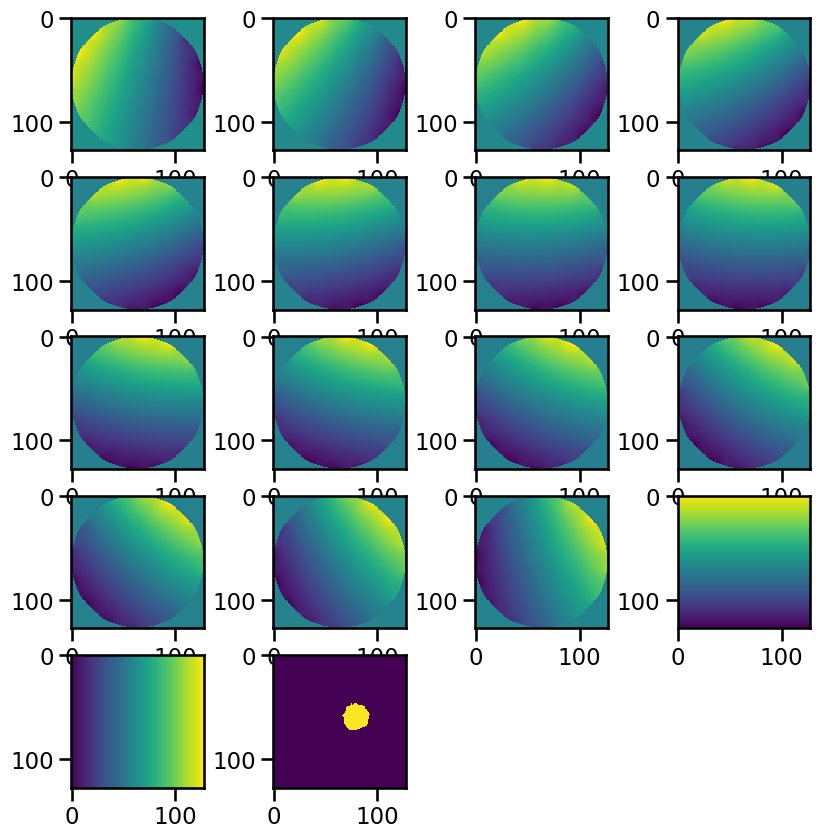

In [ ]:
'Prepare Data for training'

import os, math
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np

# T1 = np.load('EIT_Data_for_CNN.npy')

per = 0.9                               # percentage used in training

n_samples = np.array(T1).shape[0]
n_g = np.array(T1).shape[1] - 3
print('number of currents: ' + str(n_g))

n_train = math.floor(n_samples*per)    # number samples for training
print('Number of samples for training: ' + str(n_train))
n_val = n_samples - n_train        # number of samples for validation

# permute the lines
perm = np.random.permutation(n_samples)
# print(perm)
division = perm[:n_train]
division2 = perm[n_train:]
# print(division)
T1_train = []
for i in range(n_train):
  T1_train.append(T1[division[i]])
T1_val = []
for i in range(n_val):
  T1_val.append(T1[division2[i]])
print(np.array(T1_train).shape)

T2 = []
input_train = []
label_train = []
input_val = []
label_val = []

for i in range(n_samples):
  T2.append(np.transpose(T1[i]))
for i in range(n_train):
  input_train.append(np.transpose(T1_train[i][:n_g + 2]))
  label_train.append(np.transpose(T1_train[i][n_g + 2]))
for i in range(n_val):
  input_val.append(np.transpose(T1_val[i][:n_g + 2]))
  label_val.append(np.transpose(T1_val[i][n_g + 2]))

input_train = tf.convert_to_tensor(input_train)
label_train = tf.convert_to_tensor(label_train)
input_val = tf.convert_to_tensor(input_val)
label_val = tf.convert_to_tensor(label_val)

'Plot a sample'
plt.figure(figsize=(10, 10))
for i in range(0, n_g+3):
    plt.subplot(5,4,i+1)
    plt.imshow(np.transpose(T2[0])[i], interpolation='none')

# esvaziar a memoria
T1 = []
T1_train = []
T1_val = []
T2 = []

In [ ]:
# for data load
import os

# for reading and processing images
import imageio
from PIL import Image

# for visualizations
import matplotlib.pyplot as plt

import numpy as np # for using np arrays

# for bulding and running deep learning model
import tensorflow as tf
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Conv2DTranspose
from tensorflow.keras.layers import concatenate
from tensorflow.keras.losses import binary_crossentropy
from sklearn.model_selection import train_test_split


'Unet - Encoder block'

def EncoderMiniBlock(inputs, n_filters=32, dropout_prob=0.3, max_pooling=True):
    """
    This block uses multiple convolution layers, max pool, relu activation to create an architecture for learning.
    Dropout can be added for regularization to prevent overfitting.
    The block returns the activation values for next layer along with a skip connection which will be used in the decoder
    """
    # Add 2 Conv Layers with relu activation and HeNormal initialization using TensorFlow
    # Proper initialization prevents from the problem of exploding and vanishing gradients
    # 'Same' padding will pad the input to conv layer such that the output has the same height and width (hence, is not reduced in size)
    conv = Conv2D(n_filters,
                  3,   # Kernel size
                  activation='relu',
                  padding='same',
                  kernel_initializer='HeNormal')(inputs)
    conv = Conv2D(n_filters,
                  3,   # Kernel size
                  activation='relu',
                  padding='same',
                  kernel_initializer='HeNormal')(conv)

    # Batch Normalization will normalize the output of the last layer based on the batch's mean and standard deviation
    conv = BatchNormalization()(conv, training=False)

    # In case of overfitting, dropout will regularize the loss and gradient computation to shrink the influence of weights on output
    if dropout_prob > 0:
        conv = tf.keras.layers.Dropout(dropout_prob)(conv)

    # Pooling reduces the size of the image while keeping the number of channels same
    # Pooling has been kept as optional as the last encoder layer does not use pooling (hence, makes the encoder block flexible to use)
    # Below, Max pooling considers the maximum of the input slice for output computation and uses stride of 2 to traverse across input image
    if max_pooling:
        next_layer = tf.keras.layers.MaxPooling2D(pool_size = (2,2))(conv)
    else:
        next_layer = conv

    # skip connection (without max pooling) will be input to the decoder layer to prevent information loss during transpose convolutions
    skip_connection = conv

    return next_layer, skip_connection

'Unet - Decoder block'

def DecoderMiniBlock(prev_layer_input, skip_layer_input, n_filters=32):
    """
    Decoder Block first uses transpose convolution to upscale the image to a bigger size and then,
    merges the result with skip layer results from encoder block
    Adding 2 convolutions with 'same' padding helps further increase the depth of the network for better predictions
    The function returns the decoded layer output
    """
    # Start with a transpose convolution layer to first increase the size of the image
    up = Conv2DTranspose(
                 n_filters,
                 (3,3),    # Kernel size
                 strides=(2,2),
                 padding='same')(prev_layer_input)

    # Merge the skip connection from previous block to prevent information loss
    merge = concatenate([up, skip_layer_input], axis=3)

    # Add 2 Conv Layers with relu activation and HeNormal initialization for further processing
    # The parameters for the function are similar to encoder
    conv = Conv2D(n_filters,
                 3,     # Kernel size
                 activation='relu',
                 padding='same',
                 kernel_initializer='HeNormal')(merge)
    conv = Conv2D(n_filters,
                 3,   # Kernel size
                 activation='relu',
                 padding='same',
                 kernel_initializer='HeNormal')(conv)
    return conv

'Compile U-net Blocks'

def UNetCompiled(input_size=(100,100,n_g + 2), n_filters=32, n_classes=3):
   """
   Combine both encoder and decoder blocks according to the U-Net research paper
   Return the model as output
   """
   # Input size represent the size of 1 image (the size used for pre-processing)
   inputs = Input(input_size)

   # Encoder includes multiple convolutional mini blocks with different maxpooling, dropout and filter parameters
   # Observe that the filters are increasing as we go deeper into the network which will increasse the # channels of the image
   cblock1 = EncoderMiniBlock(inputs, n_filters,dropout_prob=0, max_pooling=True)
   cblock2 = EncoderMiniBlock(cblock1[0],n_filters*2,dropout_prob=0, max_pooling=True)
   cblock3 = EncoderMiniBlock(cblock2[0], n_filters*4,dropout_prob=0, max_pooling=True)
   cblock4 = EncoderMiniBlock(cblock3[0], n_filters*8,dropout_prob=0.3, max_pooling=True)
   cblock5 = EncoderMiniBlock(cblock4[0], n_filters*16, dropout_prob=0.3, max_pooling=False)

   # Decoder includes multiple mini blocks with decreasing number of filters
   # Observe the skip connections from the encoder are given as input to the decoder
   # Recall the 2nd output of encoder block was skip connection, hence cblockn[1] is used
   ublock6 = DecoderMiniBlock(cblock5[0], cblock4[1],  n_filters * 8)
   ublock7 = DecoderMiniBlock(ublock6, cblock3[1],  n_filters * 4)
   ublock8 = DecoderMiniBlock(ublock7, cblock2[1],  n_filters * 2)
   ublock9 = DecoderMiniBlock(ublock8, cblock1[1],  n_filters)

   # Complete the model with 1 3x3 convolution layer (Same as the prev Conv Layers)
   # Followed by a 1x1 Conv layer to get the image to the desired size.
   # Observe the number of channels will be equal to number of output classes
   conv9 = Conv2D(n_filters,
                3,
                activation='relu',
                padding='same',
                kernel_initializer='he_normal')(ublock9)

   conv10 = Conv2D(n_classes, 1, padding='same')(conv9)

   # Define the model
   model = tf.keras.Model(inputs=inputs, outputs=conv10)

   return model

'Build U-net architeture'

# Call the helper function for defining the layers for the model, given the input image size
unet = UNetCompiled(input_size=(128,128,n_g + 2), n_filters=32, n_classes=1)
# Check the summary to better interpret how the output dimensions change in each layer
unet.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 128, 128, 17)]       0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 128, 128, 32)         4928      ['input_1[0][0]']             
                                                                                                  
 conv2d_1 (Conv2D)           (None, 128, 128, 32)         9248      ['conv2d[0][0]']              
                                                                                                  
 batch_normalization (Batch  (None, 128, 128, 32)         128       ['conv2d_1[0][0]']            
 Normalization)                                                                               

In [ ]:
'Run model'

# There are multiple optimizers, loss functions and metrics that can be used to compile multi-class segmentation models
# Ideally, try different options to get the best accuracy
unet.compile(optimizer=tf.keras.optimizers.Adam(),
             #loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
             loss='MeanSquaredError'
             #metrics=['accuracy']
             )

# Run the model in a mini-batch fashion and compute the progress for each epoch
results = unet.fit(input_train, label_train,
                   batch_size=4,
                   steps_per_epoch=3,
                   epochs=10,
                   validation_data=(input_val, label_val),
                   verbose = 1)



Epoch 1/10
3/3 [==============================] - 29s 4s/step - loss: 0.1111 - val_loss: 0.0927
Epoch 2/10
3/3 [==============================] - 12s 4s/step - loss: 0.0929 - val_loss: 0.0881
Epoch 3/10
3/3 [==============================] - 14s 4s/step - loss: 0.0904 - val_loss: 0.0844
Epoch 4/10
3/3 [==============================] - 10s 3s/step - loss: 0.0865 - val_loss: 0.0885
Epoch 5/10
3/3 [==============================] - 11s 4s/step - loss: 0.0904 - val_loss: 0.0881
Epoch 6/10
3/3 [==============================] - 11s 4s/step - loss: 0.0794 - val_loss: 0.0861
Epoch 7/10
3/3 [==============================] - 12s 5s/step - loss: 0.0779 - val_loss: 0.0852
Epoch 8/10
3/3 [==============================] - 9s 3s/step - loss: 0.0872 - val_loss: 0.0844
Epoch 9/10
3/3 [==============================] - 10s 3s/step - loss: 0.0843 - val_loss: 0.0834
Epoch 10/10
3/3 [==============================] - 10s 4s/step - loss: 0.0768 - val_loss: 0.0821


1/1 [==============================] - 1s 606ms/step


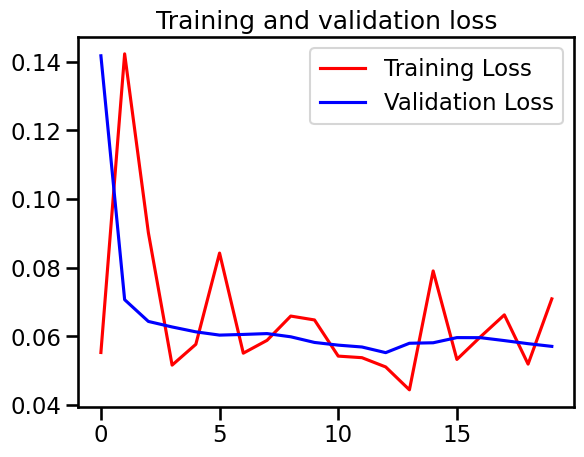

In [ ]:
#-----------------------------------------------------------
# Retrieve a list of results on training and test data
# sets for each training epoch
#-----------------------------------------------------------

import matplotlib.pyplot as plt

#acc      = history.history['MeanAbsolutePercentageError' ]
#val_acc  = history.history[ 'val_accuracy' ]
loss     = results.history[    'loss' ]
val_loss = results.history['val_loss' ]

epochs   = range(len(loss)) # Get number of epochs

#------------------------------------------------
# Plot training and validation accuracy per epoch
#------------------------------------------------
#plt.plot(epochs, acc, 'bo', label='Training accuracy')
#plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
#plt.title ('Training and validation accuracy')
#plt.figure()

#------------------------------------------------
# Plot training and validation loss per epoch
#------------------------------------------------
plt.plot(epochs, loss, 'r', label='Training Loss')
plt.plot(epochs, val_loss, 'b', label='Validation Loss')
plt.title ('Training and validation loss'   )
plt.legend()

'Make Prediction and save the model'

import os, shutil
import numpy as np

classes = unet.predict(input_val)

'Save Model'
if os.path.isdir("EIT_model/"):    # Remove directory if it exists
    shutil.rmtree("EIT_model/")
# Create directories
dir = 'EIT_model'
os.makedirs(dir, exist_ok = True)
# Save
# model.save('EIT_model/unet.keras')
unet.save('EIT_model/unet.keras')

'Save validation set'
os.makedirs('Validation', exist_ok = True)
np.save('Validation/input_val', input_val)
np.save('Validation/label_val', label_val)

# model = tf.keras.models.load_model('unet.keras')

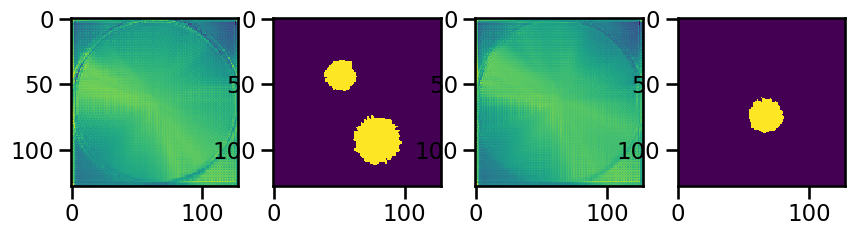

In [ ]:
'Plot prediction'

example = 0

plt.figure(figsize=(10, 10))
plt.subplot(4,4,1)
plt.imshow(classes[example], interpolation='none')
plt.subplot(4,4,2)
plt.imshow(label_val[example], interpolation='none')
plt.subplot(4,4,3)
plt.imshow(classes[example+1], interpolation='none')
plt.subplot(4,4,4)
plt.imshow(label_val[example+1], interpolation='none')
# plt.colorbar()

# print(label_val[example][10][20])